# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [48]:
import os
import cv2

# -------------------------
# PATH للـ dataset داخل Kaggle Notebook
# غيري 'asl-alphabet' باسم الفولدر اللي عندك على Kaggle
dataset_path = "/kaggle/input/asl-alphabet"

MIN_IMAGE_SIZE = 5000  # 5 KB

# -------------------------
# تنظيف سريع للصور
for root, dirs, files in os.walk(dataset_path):
    for file in files:
        file_path = os.path.join(root, file)
        
        # 1) مش صورة؟ امسحي
        if not file.lower().endswith((".jpg", ".jpeg", ".png")):
            os.remove(file_path)
            print("Deleted non-image:", file_path)
            continue
        
        # 2) حجم = 0؟ امسحي
        size = os.path.getsize(file_path)
        if size == 0:
            os.remove(file_path)
            print("Deleted zero-size:", file_path)
            continue
        
        # 3) حجم صغير جدًا؟ (محتمل بايظ)
        if size < MIN_IMAGE_SIZE:
            img = cv2.imread(file_path)
            if img is None:
                os.remove(file_path)
                print("Deleted corrupted small file:", file_path)
            continue

print("Done fast cleaning!")


Done fast cleaning!


In [49]:
from collections import Counter
import os

# -------------------------
# PATH للـ dataset داخل Kaggle Notebook
dataset_path = "/kaggle/input/asl-alphabet"  # غيري حسب فولدر الداتا عندك

# -------------------------
# عد الصور لكل class
class_counts = Counter()

for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            class_name = os.path.basename(root)
            class_counts[class_name] += 1

# -------------------------
# طباعة عدد الصور لكل class
for cls, count in class_counts.items():
    print(f"Class {cls}: {count} images")


Class asl_alphabet_test: 28 images
Class N: 3000 images
Class R: 3000 images
Class space: 3000 images
Class B: 3000 images
Class I: 3000 images
Class del: 3000 images
Class F: 3000 images
Class H: 3000 images
Class E: 3000 images
Class U: 3000 images
Class M: 3000 images
Class X: 3000 images
Class K: 3000 images
Class Q: 3000 images
Class Y: 3000 images
Class S: 3000 images
Class G: 3000 images
Class A: 3000 images
Class O: 3000 images
Class T: 3000 images
Class V: 3000 images
Class Z: 3000 images
Class C: 3000 images
Class P: 3000 images
Class L: 3000 images
Class W: 3000 images
Class D: 3000 images
Class nothing: 3000 images
Class J: 3000 images


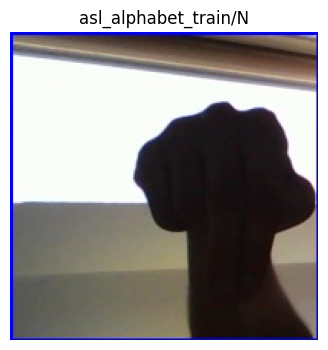

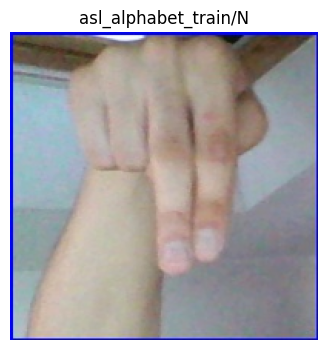

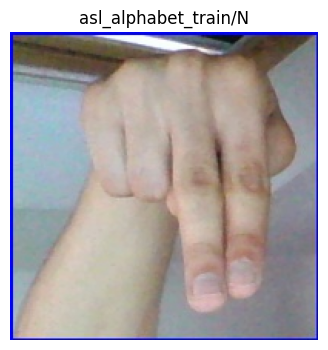

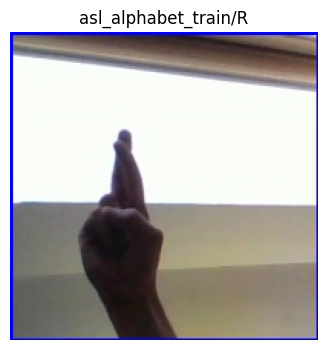

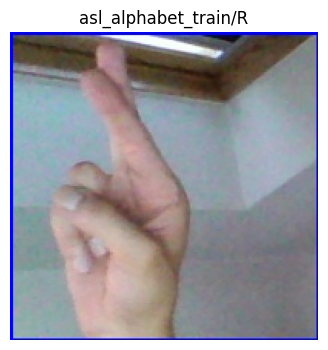

...

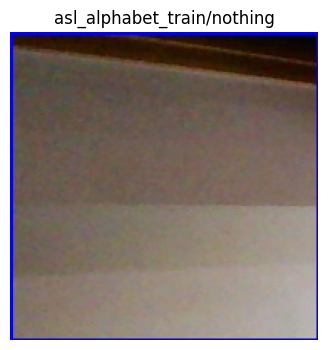

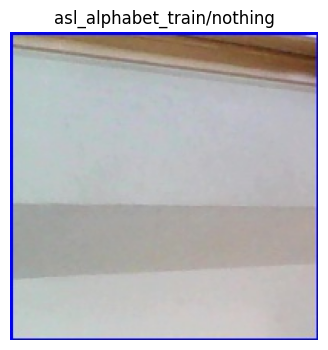

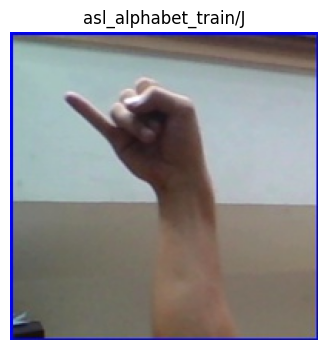

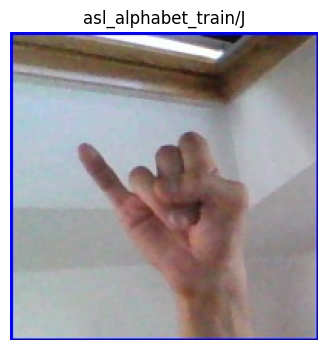

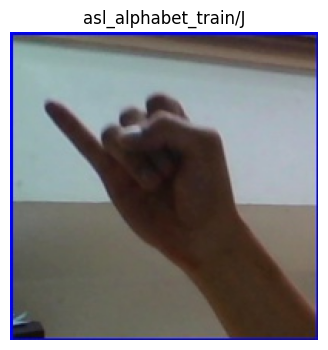

In [50]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# -------------------------
# دالة لعرض الصور
def show_image(image, title=None):
    plt.figure(figsize=(4, 4))
    plt.axis(False)
    if title:
        plt.title(title)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

# -------------------------
# PATH للـ dataset داخل Kaggle Notebook
dataset_path = "/kaggle/input/asl-alphabet"  # غيري حسب فولدر الداتا عندك
num_samples = 3  # عدد الصور العشوائية لكل class

# -------------------------
# عرض صور عشوائية لكل class
for split in os.listdir(dataset_path):  # غالبًا الفولدر فيه كل الصور مباشرة
    split_path = os.path.join(dataset_path, split)
    if not os.path.isdir(split_path):
        continue
    
    # ادخل على الفولدر الداخلي الذي يحتوي الفئات
    inner_folders = [f for f in os.listdir(split_path) if os.path.isdir(os.path.join(split_path, f))]
    
    for inner in inner_folders:
        inner_path = os.path.join(split_path, inner)
        for cls in os.listdir(inner_path):  # A / B / ... / Z
            folder_path = os.path.join(inner_path, cls)
            if not os.path.isdir(folder_path):
                continue
            
            # جلب كل الصور الصالحة
            images = [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
            
            if len(images) == 0:
                print(f"⚠️ Folder '{cls}' in split '{split}' is EMPTY")
                continue
            
            # اختيار 3 صور عشوائية بدون تكرار
            samples = random.sample(images, min(num_samples, len(images)))
            for sample in samples:
                img = cv2.imread(os.path.join(folder_path, sample))
                show_image(img, title=f"{split}/{cls}")


In [51]:
import os
import cv2
import random

# -------------------------
# PATH للـ dataset داخل Kaggle Notebook
dataset_path = "/kaggle/input/asl-alphabet"  # غيري حسب فولدر الداتا عندك
num_samples = 5  # عدد الصور العشوائية لكل class

# -------------------------
# عرض أبعاد الصور العشوائية لكل class
for split in os.listdir(dataset_path):
    split_path = os.path.join(dataset_path, split)
    if not os.path.isdir(split_path):
        continue
    
    inner_folders = [f for f in os.listdir(split_path) if os.path.isdir(os.path.join(split_path, f))]
    
    for inner in inner_folders:
        inner_path = os.path.join(split_path, inner)
        for cls in os.listdir(inner_path):
            folder_path = os.path.join(inner_path, cls)
            if not os.path.isdir(folder_path):
                continue
            
            images = [f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
            if len(images) == 0:
                continue
            
            # اختيار عينات عشوائية
            samples = random.sample(images, min(num_samples, len(images)))
            sizes = []
            for sample in samples:
                img = cv2.imread(os.path.join(folder_path, sample))
                if img is not None:
                    h, w = img.shape[:2]
                    sizes.append((w, h))
            
            print(f"Class '{cls}' in split '{split}': sample sizes (w x h) = {sizes}")


Class 'N' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'R' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'space' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'B' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'I' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'del' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'F' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 200)]
Class 'H' in split 'asl_alphabet_train': sample sizes (w x h) = [(200, 200), (200, 200), (200, 200), (200, 200), (200, 

In [52]:
import os

print("📂 /kaggle/input:")
for item in os.listdir("/kaggle/input"):
    print("-", item)

📂 /kaggle/input:
- asl-alphabet


In [53]:
base = "/kaggle/input/asl-alphabet"

print("📂 asl-alphabet:")
for item in os.listdir(base):
    print("-", item)


📂 asl-alphabet:
- asl_alphabet_test
- asl_alphabet_train


In [12]:
import os
import shutil
from sklearn.model_selection import train_test_split  


input_root = '/kaggle/input/asl-alphabet/'
original_train_dir = os.path.join(input_root, 'asl_alphabet_train/asl_alphabet_train/')
original_test_dir = os.path.join(input_root, 'asl_alphabet_test/asl_alphabet_test/')


working_root = '/kaggle/working/asl_alphabet/'
working_train_dir = os.path.join(working_root, 'train/')
working_test_dir = os.path.join(working_root, 'test/')


if not os.path.exists(working_root):
    os.makedirs(working_root, exist_ok=True)


if os.path.exists(working_test_dir) and len(os.listdir(working_test_dir)) > 0:
    print("It is already done before")
else:
    
    os.makedirs(working_train_dir, exist_ok=True)
    os.makedirs(working_test_dir, exist_ok=True)

    
    classes = [d for d in os.listdir(original_train_dir) if os.path.isdir(os.path.join(original_train_dir, d))]
    print(f"الـ classes اللي لقيتها: {classes}")

    
    for cls in classes:
        original_class_dir = os.path.join(original_train_dir, cls)
        working_train_class_dir = os.path.join(working_train_dir, cls)
        working_test_class_dir = os.path.join(working_test_dir, cls)

        
        os.makedirs(working_train_class_dir, exist_ok=True)
        os.makedirs(working_test_class_dir, exist_ok=True)

        
        images = [f for f in os.listdir(original_class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        images.sort()  

        
        num_images = len(images)
        num_test = int(0.2 * num_images)  
        num_train = num_images - num_test

        
        train_images = images[:num_train]
        test_images = images[num_train:]

        
        for img in train_images:
            src = os.path.join(original_class_dir, img)
            dst = os.path.join(working_train_class_dir, img)
            if not os.path.exists(dst):  
                shutil.copy(src, dst)

        
        for img in test_images:
            src = os.path.join(original_class_dir, img)
            dst = os.path.join(working_test_class_dir, img)
            if not os.path.exists(dst):  
                shutil.copy(src, dst)

        print(f"Processed class '{cls}': {num_train} Image in train, {num_test}Image in test")

    print(f"Finished!,the new data in: {working_root}")
    print(" train: " + working_train_dir + " (From images,80% without duplicates)")
    print(" test : " + working_test_dir + " (The images are originally empty and then filled with 20% of the new content)")
    print("Done")



الـ classes اللي لقيتها: ['N', 'R', 'space', 'B', 'I', 'del', 'F', 'H', 'E', 'U', 'M', 'X', 'K', 'Q', 'Y', 'S', 'G', 'A', 'O', 'T', 'V', 'Z', 'C', 'P', 'L', 'W', 'D', 'nothing', 'J']
Processed class 'N': 2400 Image in train, 600Image in test
Processed class 'R': 2400 Image in train, 600Image in test
Processed class 'space': 2400 Image in train, 600Image in test
Processed class 'B': 2400 Image in train, 600Image in test
Processed class 'I': 2400 Image in train, 600Image in test
Processed class 'del': 2400 Image in train, 600Image in test
Processed class 'F': 2400 Image in train, 600Image in test
Processed class 'H': 2400 Image in train, 600Image in test
Processed class 'E': 2400 Image in train, 600Image in test
Processed class 'U': 2400 Image in train, 600Image in test
Processed class 'M': 2400 Image in train, 600Image in test
Processed class 'X': 2400 Image in train, 600Image in test
Processed class 'K': 2400 Image in train, 600Image in test
Processed class 'Q': 2400 Image in train, 60